# Machine Learning LAB 3: CLUSTERING - K-means and linkage-based clustering

Course 2023/24: *M. Caligiuri*, *P. Talli*, *F. Lincetto*, *F. Chiariotti*, *P. Zanuttigh*

The notebook contains some simple tasks about **CLUSTERING**.

Complete all the **required code sections** and **answer to all the questions**.

### IMPORTANT for the evaluation score:

1. **Read carefully all cells** and **follow the instructions**.
2. **Re-run all the code from the beginning** to obtain the results for the final version of your notebook, since this is the way we will do it before evaluating your notebooks.
3. Make sure to fill the code in the appropriate places **without modifying the template**, otherwise you risk breaking later cells.
4. Please **submit the jupyter notebook file (.ipynb)**, do not submit python scripts (.py) or plain text files. **Make sure that it runs fine with the restat&run all command**.
5. **Answer the questions in the appropriate cells**, not in the ones where the question is presented.

## Image segmentation with k-means

In this laboratory we will use the k-means algorithm to cluster a dataset of 3D points. We will apply **K-means** to the problem of image compression and image segmentation. The main idea is to apply k-means to the colors of the pixels of an image to select the k most representative colors. Then, we will replace each pixel color with the closest representative color. This will allow us to reduce the number of colors in the image and compress it. A color is a vector of 3 values (R,G,B) that represent the amount of red, green and blue in the color; this implies that each pixel is a point in a 3D space.

In particular you are going to implement the k-means algorithm from scratch and to compare the results with the implementation already present in the sklearn library.

In the second part of the laboratory we will use a **linkage-based** clustering algorithm to cluster a dataset of 2D points and compare it with the results obtained with k-means.

---

## Preliminary step

Place your **name** and **ID number** (matricola) in the cell below. <br>
Also recall to **save the file as Surname_Name_LAB02.ipynb**, failure to do so will incur in a **lower grade**.

**Student name**: Andrea Turci

**ID Number**: 2106724

---

## Import all the necessary Python libraries

In [1]:
%matplotlib inline  

import numpy as np
import typing as tp
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering
from matplotlib import pyplot as plt

---

## Define the heplper functions

In this section you will find some helper functions (some already implemented, some to be implemented by you) that will be used in the following sections.
1. `img_plot` -> function to plot an image with name and dimension as title,
2. `scatter_plot` -> function to plot a scatter plot of the data,
3. `scatter_plot_2d` -> function to plot a 2D scatter plot of the data,
4. `error_plot` -> function to plot the error of the k-means algorithm over the iterations,
5. `cluster_plot` -> function to plot the obtained clusters.

**DO NOT CHANGE THE PRE-WRITTEN CODE UNLESS OTHERWISE SPECIFIED**

In [2]:
def img_plot(img: np.ndarray, title: str = None) -> None:
    """
    Plot an image
    :param img: image to plot
    :param title: title of the plot
    """
    
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    if title is not None:
        plt.title(f'{title}: {img.shape}')
    plt.tight_layout()
    plt.show()
    plt.close()

In [3]:
def scatter_plot(data: np.ndarray, clusters: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param data: data to plot
    :param clusters: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """
    
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue", rotation=90, labelpad=-1)
    if title is not None:
        plt.title(title)
    if clusters is None:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=data, s=5)
    else:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=clusters, s=1, cmap='viridis', zorder=0, alpha=0.5 )
    if centers is not None:
        axis.scatter(centers[:,0], centers[:,1], centers[:,2], c='red', s=400, zorder=10)
    plt.tight_layout()
    plt.show()
    plt.close()

In [4]:
def scatter_plot_2d(x: np.ndarray, y: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param x: data to plot
    :param y: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """

    fig = plt.figure()
    plt.scatter(x[:,0], x[:,1], c=y, marker="o", s=10, cmap='viridis')
    plt.scatter(centers[:,0], centers[:,1], c='black', s=200, alpha=0.5)
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

In [5]:
def error_plot(errors: np.ndarray, labels: np.ndarray = None) -> None:
    """
    Plot the errors over the iterations
    :param errors: errors to plot
    """
    
    if labels is None:
        plt.plot(errors[1:-1])
        plt.plot(errors[1:-1], 'ro')
    else:
        plt.plot(labels, errors)
        plt.plot(labels, errors, 'ro')
    plt.title('Error over iterations')
    plt.ylabel('Error')
    plt.xlabel('Iteration #')
    plt.grid()
    plt.tight_layout()
    plt.show()
    plt.close()

In [6]:
def cluster_plot(labels: np.ndarray, x: np.ndarray, title: str = None) -> None:
    """
    Plot the clusters
    :param labels: cluster labels
    :param x: data
    :param title: title of the plot
    """
    
    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
            for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=14)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=6)

    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

---

## A) K-means clustering

### TO DO (A.0)
    
**Set** the random **seed** using your **ID**. If you need to change it for testing add a constant explicitly, eg.: 1234567 + 1

In [7]:
# Fix your ID ("numero di matricola") and the seed for random generator
# as usual you can try different seeds by adding a constant to the number:
# ID = 1234567 + X
ID = 2106724
np.random.seed(ID)


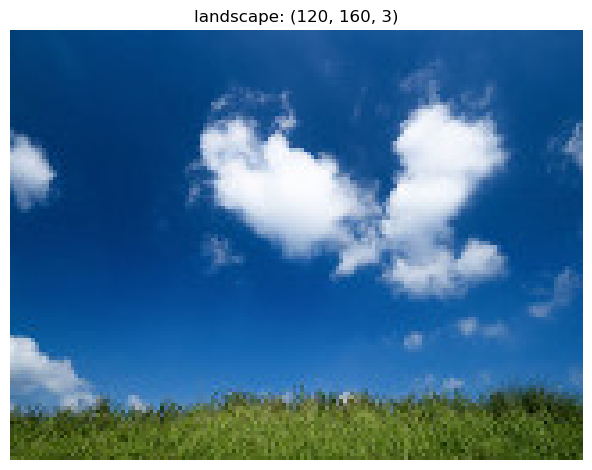

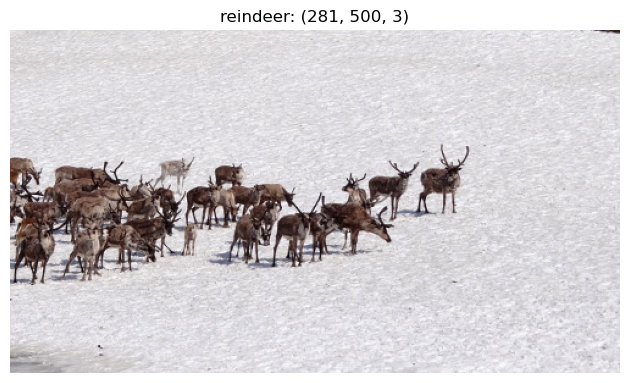

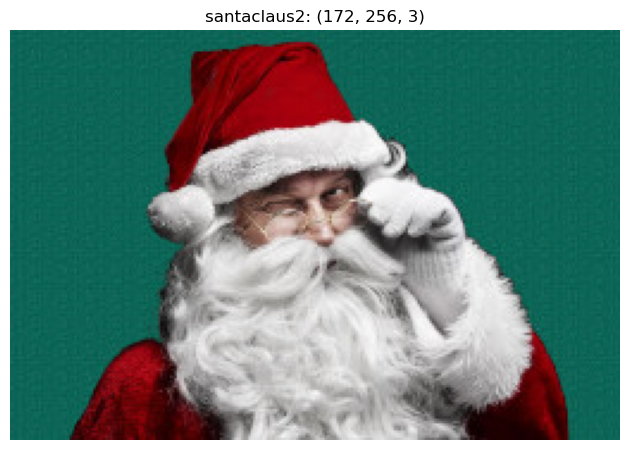

In [8]:
# Load the provided images and display them (if you like you can experiment with other images)
# To load the images use the function plt.imread(<path_to_iamge>)
image1 = plt.imread("data/landscape.jpg")
image2 = plt.imread("data/reindeer.jpg")
image3 = plt.imread("data/santaclaus2.jpg")

# Plot the images with their shapes
# Sugestion: use the function img_plot()
img_plot(image1, "landscape")
img_plot(image2, "reindeer")
img_plot(image3, "santaclaus2")


We are going to start by using the Santa Claus image.


In [9]:
# Reshape the data to a matrix of num_pixels x 3 
# (divide by 255 to have colors in [0 1] range for plotting functions of sklearn)
image3 = image3 / 255

num_pixels = image3.shape[0]*image3.shape[1]

reshaped = image3.reshape(num_pixels, 3)

print(reshaped)
print(len(reshaped))

# Print the shape of the data and the min and max values of the pixels

max_red = reshaped[:, 0].max()
min_red = reshaped[:, 0].min()

max_green = reshaped[:, 1].max()
min_green = reshaped[:, 1].min()

max_blue = reshaped[:, 2].max()
min_blue = reshaped[:, 2].min()

print(max_red)
print(min_red)
print(max_green)
print(min_green)
print(max_blue)
print(min_blue)

[[0.05490196 0.4        0.34509804]
 [0.05098039 0.39607843 0.34117647]
 [0.05098039 0.39607843 0.34117647]
 ...
 [0.05882353 0.40392157 0.34901961]
 [0.05882353 0.40392157 0.34901961]
 [0.05882353 0.40392157 0.34901961]]
44032
1.0
0.0
1.0
0.0
1.0
0.0


Plot the points in the 3-dimensional space with normalized intervals between 0 and 1 (corresponding to the three channels of the image, i.e. Red Green and Blue)

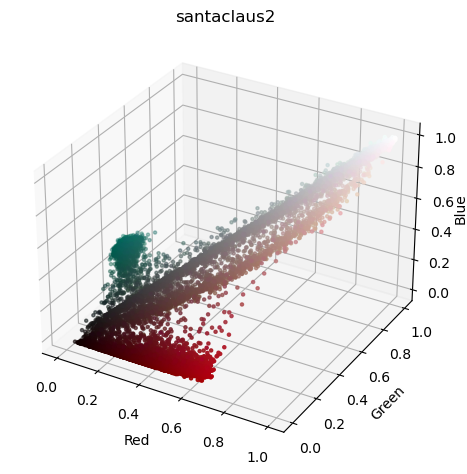

In [10]:
# Sugestion: use the function scatter_plot()
scatter_plot(reshaped, title = "santaclaus2")

### TO DO (A.1)
Implement the k-means algorithm manually (**do not use the kmeans function of sklearn and do not download implementations from other web sources**). The inputs to the function is the set of vectors to be clustered and the number of clusters. The output must contain the clusters barycenters, a vector associating each data point to the corresponding cluster and the error (value of the cost function) at each iteration.
Additionally, fix a maximum number of iterations of the k-means algorithm (e.g., 50).

Be careful about the initalization, you can use some random points from the training set, or get random values but ensure they are in the proper range. Poor initalizations can lead to the failure of the algorithm (in particular check that no cluster is initialized as empty, otherwise the algorithm can not update it).

In [11]:
def my_kmeans(points: np.ndarray, k: int, max_iters: int = 50) -> tp.Tuple[np.ndarray, np.ndarray, list]:
    """
    Perform K-means clustering
    :param points: data points
    :param k: number of clusters
    :param max_iters: maximum number of iterations
    """

    # Generate random centers
    # use sigma and mean to ensure it represent the whole data
    
    centroids = points.mean() + points.std() * np.random.rand(k, points.shape[1])
    
  
    prev_error = 100000
    error = [9999]
    
    # Iterate until the estimate of that center stays the same or max iteration are reached
    iters = 0
    while (error[iters] != prev_error) and iters < max_iters:
        # Measure the distance to every center

        distances = []
        for point in points:
            point_distance = [np.linalg.norm(point - centroid) for centroid in centroids]
            distances.append(point_distance)
            
        # Assign all training data to closest center

        clusters = np.zeros(points.shape[0])
        

        for i in range(len(distances)):
            closest_value = np.argmin(distances[i])     #varies from 0 to k
            clusters[i] = closest_value
            
        for i in range(k):
            mean_value = np.mean(points[clusters==i], axis=0)
            centroids[i] = mean_value

        
        # Update the error
        error_value = 0

        for i in range(k):
            for point in points[clusters==i]:
                error_value += (np.linalg.norm(point- centroids[i]))**2

        error.append(error_value)
            
        
        # Update the iteration counter
        iters += 1

   

    return centroids, clusters, error

### TO DO (A.2)

Now try the function you developed on the Santaclaus image with three clusters (k=3). 

Then plot the data points in the 3-dimensional space, each point must be coloured based on the membership to one of the clusters. Additionally, plot the respective clusters centroids (use a different shape, size or color to highlight the centroids).

[9999, 1372.3193735641391, 1180.869489687238, 1130.4898053097368, 1099.1043285183341, 1093.871826939525, 1093.0327807002604, 1092.904082581298, 1092.8827166077015, 1092.8772697296424, 1092.8767238335254, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821, 1092.87654974821]


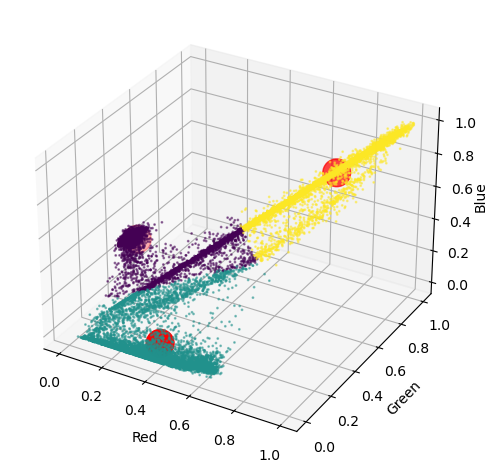

In [12]:
# Run your K-means function on the data
results = my_kmeans(reshaped, 3)

# Print the errors:
print(results[2])


# Plot the results
scatter_plot(reshaped, results[1], results[0])

### TO DO (A.3) 
Plot the value of the error versus the number of iterations

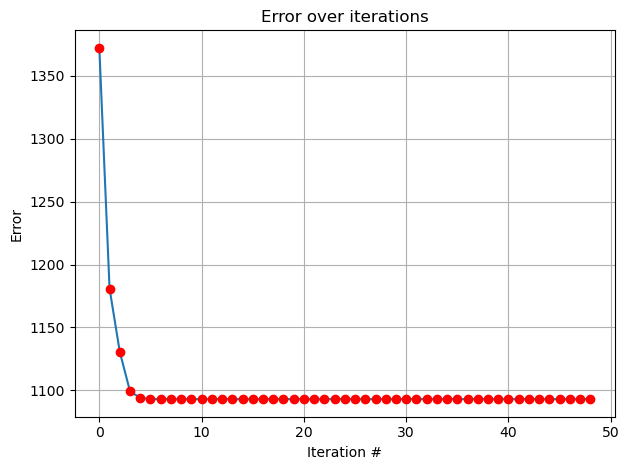

In [13]:
# Sugestion: use the function error_plot()
error_plot(results[2], labels = None)

### TO DO (A.4)
Now use the k-means function provided in sklearn. Pass to the function the number of clusters and use multiple random initializations (n_init parameter). Go to the documentation page for further details

In [14]:
# Define the K-means model
kmeans = KMeans(n_clusters=3, max_iter=50, random_state=0, n_init="auto")

# Fit the model to the data
kmeans.fit(reshaped)

# Get the cluster centers
kmeans.cluster_centers_

array([[0.77988785, 0.77030481, 0.76761854],
       [0.3926693 , 0.05501808, 0.06812511],
       [0.07810032, 0.39478621, 0.34319186]])

Perform the same plot as above but with the output of the k-means function provided in sklearn.

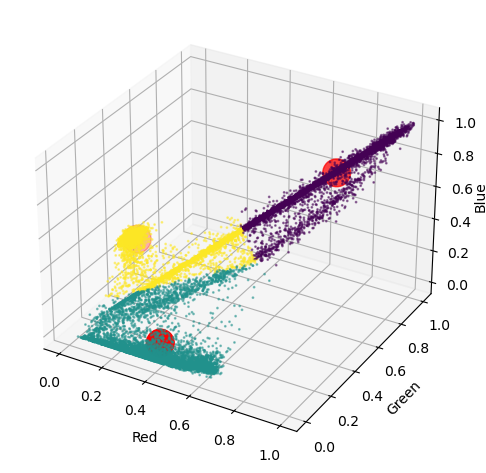

In [15]:
scatter_plot(reshaped, kmeans.labels_, kmeans.cluster_centers_)

### TO DO (A.Q1) [Answare the following] 

Compare the results obtained with your implementation and with k-means from sklearn. Do you observe any differences, *i.e.*, do the two plots match?

**ANSWER A.Q2:** 
The division in clusters seems to be identical apart from the different permutation of colors used for the two plots.

### TO DO (A.5)

Now display the segmented image based on the two clusters found above with the k-means functions by sklearn.

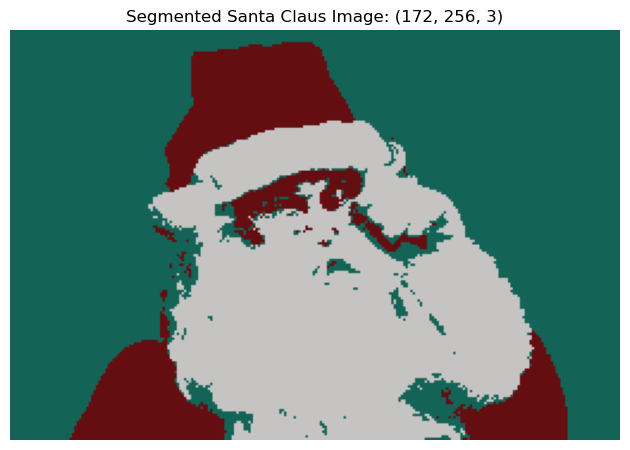

In [16]:
# Extract the color values of the centers
cluster_centers = kmeans.cluster_centers_       #centers

# Reshape the data to the original image shape
segmented_image = cluster_centers[kmeans.labels_].reshape(image3.shape) #centers[clusters]

# Plot the recolored image
img_plot(segmented_image, "Segmented Santa Claus Image")

Now display the segmented image based on the two clusters found above with the k-means functions implemented by yourselves.

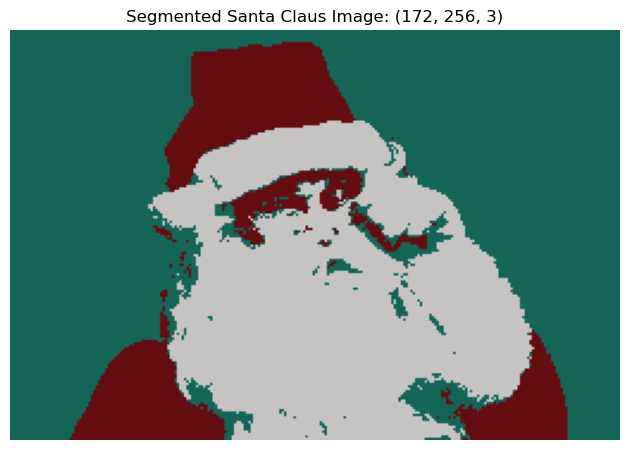

In [17]:
# Extarct the color values of the centers
centers_implem = results[0]

# Reshape the data to the original image shape
cluster_labels_int = results[1].astype(int)
segm_image_implem = centers_implem[cluster_labels_int].reshape(image3.shape)

# Plot the recolored image
img_plot(segm_image_implem, "Segmented Santa Claus Image")

### TO DO (A.Q2) [Answare the following]

What do you observe? Do you think clustering is useful for image segmenation? And for image compression? Comment your answer.

**ANSWER A.Q1:** 
We were able to apply the k-means algorithm to both tasks, as can be seen in the earlier photographs. The image was divided into regions based on pixel colors that were comparable to each other. It was also compressed by determining the mean color of each cluster and dividing the total number of colors by the number of clusters. The quality of these procedures is obviously very dependent on the image we have to work with and the k-means algorithm's parameters. For instance, an image with more clusters can be segmented into more sections and include more detail, but the compression potential of the image is also limited.

### TO DO (A.6)

Now load the landscape image (optional: try also with the reindeer image) and segment it using kmeans with k varying from 2 to 15 clusters. You can use the sklearn implementation.

Then plot the resulting data points in the 3-dimensional space, each point must be colored based on the cluster membership.

[[0.00392157 0.24313725 0.45490196]
 [0.00784314 0.24705882 0.4627451 ]
 [0.01176471 0.25098039 0.46666667]
 ...
 [0.13333333 0.21176471 0.00392157]
 [0.2        0.28235294 0.05098039]
 [0.27058824 0.35686275 0.10588235]]
19200
1.0
0.0
1.0
0.058823529411764705
1.0
0.0


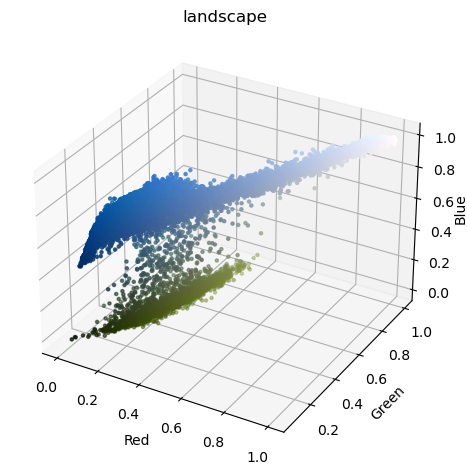


K-means clustering with different values of K (2-15):
BELOW I'M USING K =  2


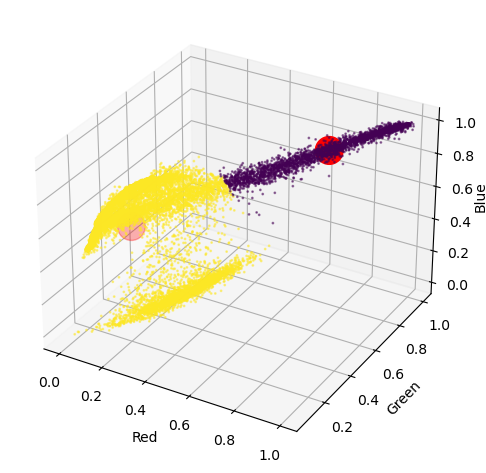

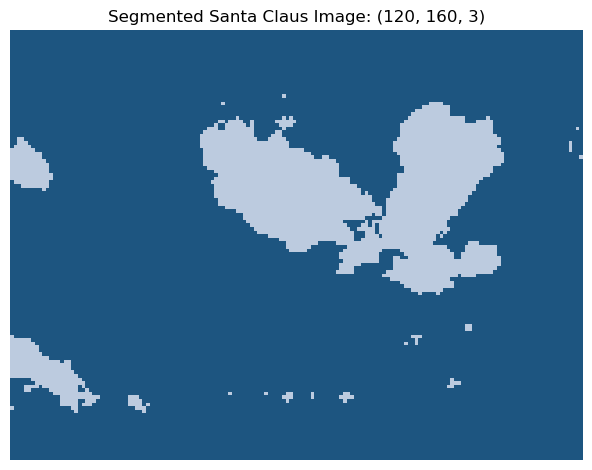

BELOW I'M USING K =  3


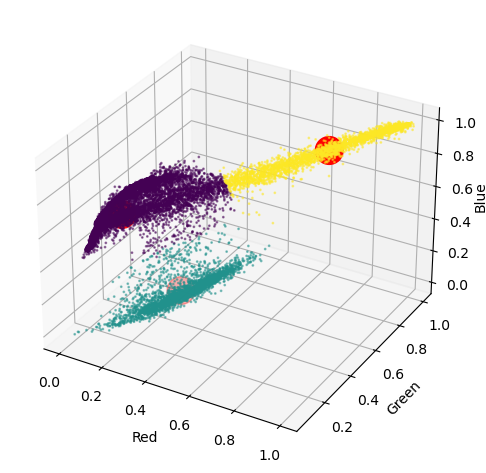

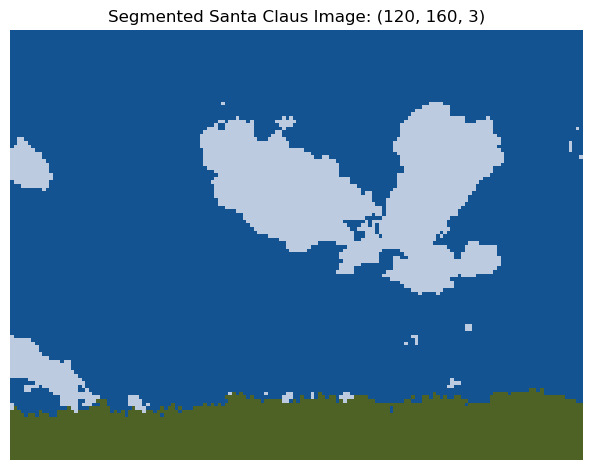

BELOW I'M USING K =  4


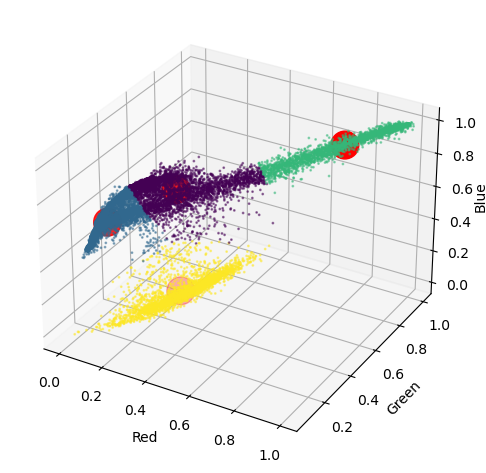

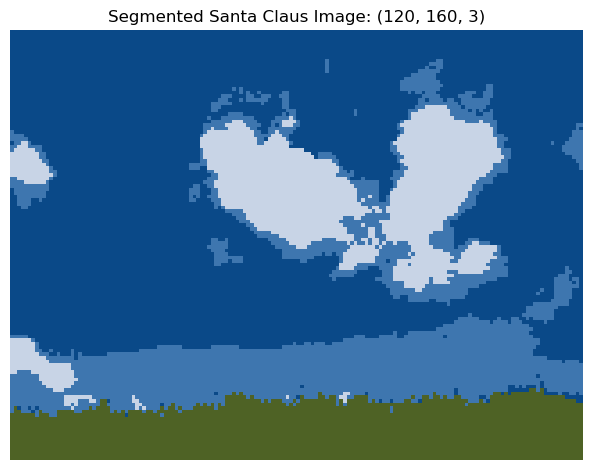

BELOW I'M USING K =  5


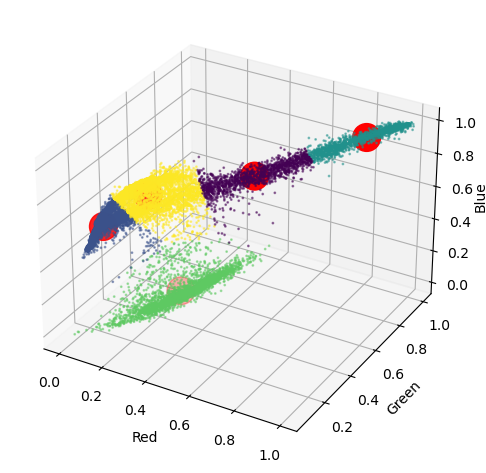

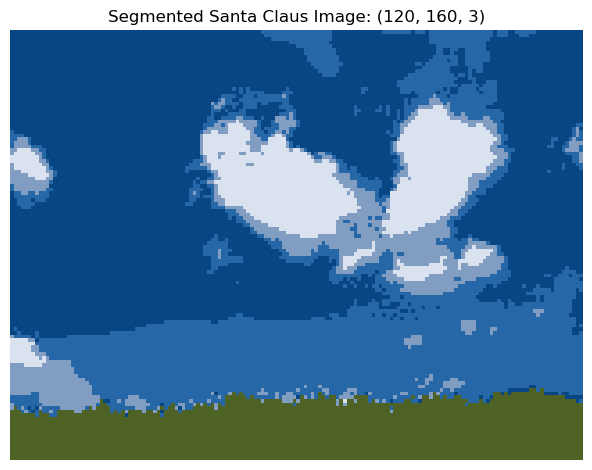

BELOW I'M USING K =  6


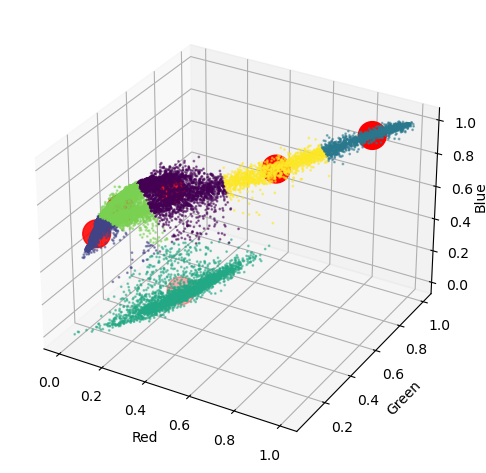

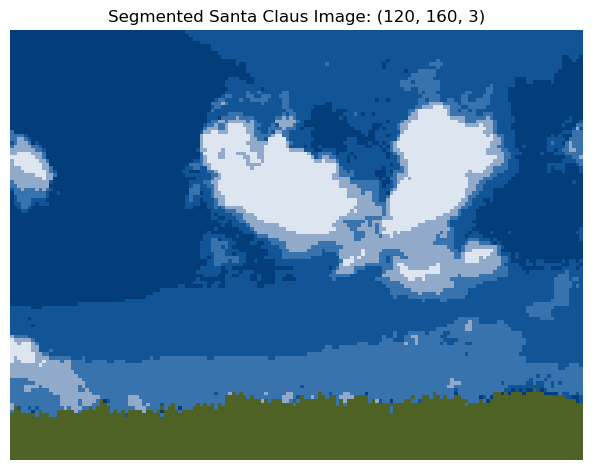

BELOW I'M USING K =  7


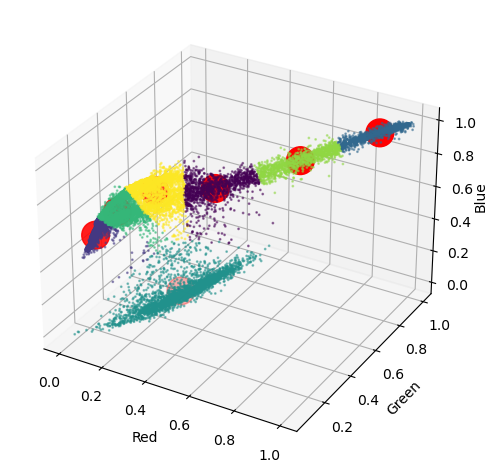

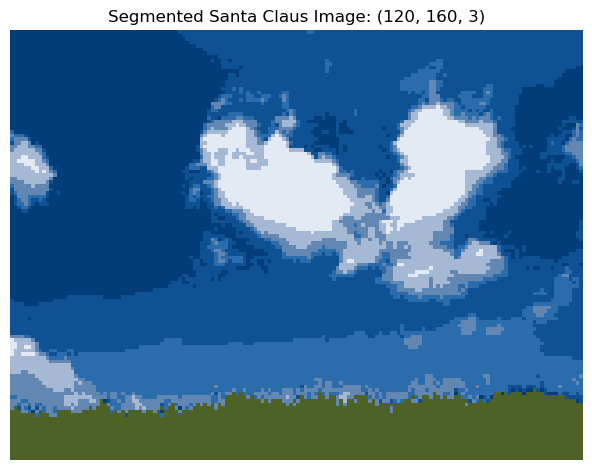

BELOW I'M USING K =  8


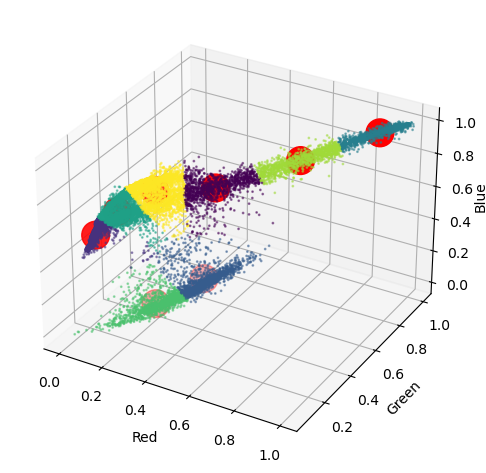

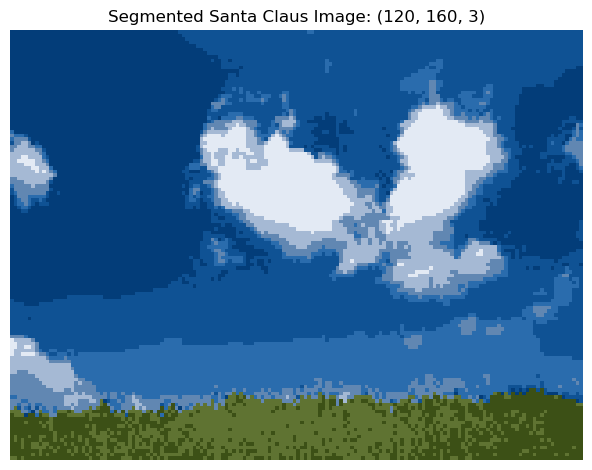

BELOW I'M USING K =  9


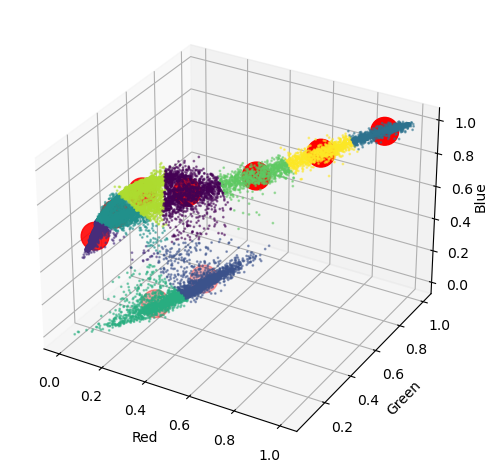

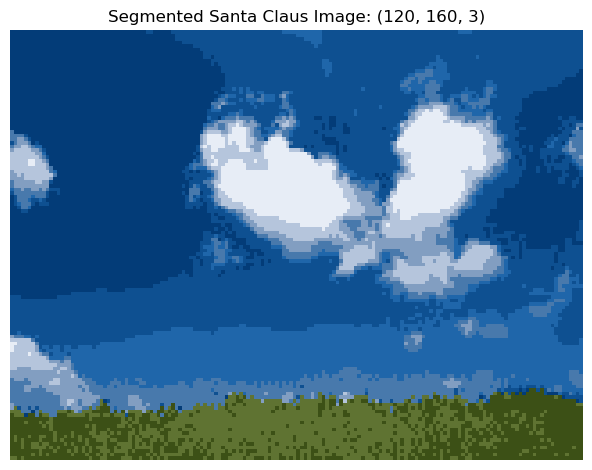

BELOW I'M USING K =  10


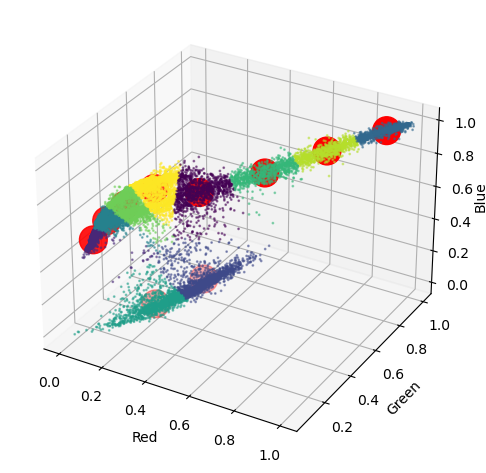

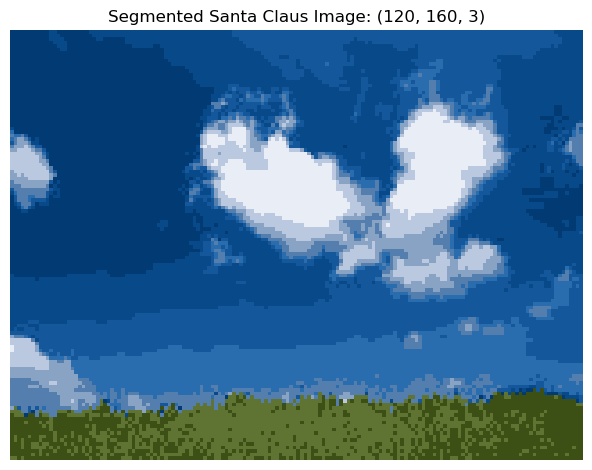

BELOW I'M USING K =  11


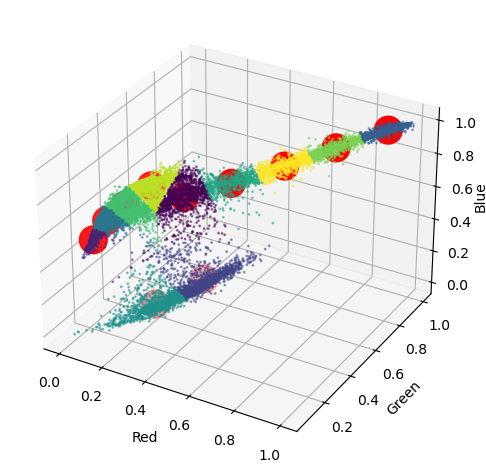

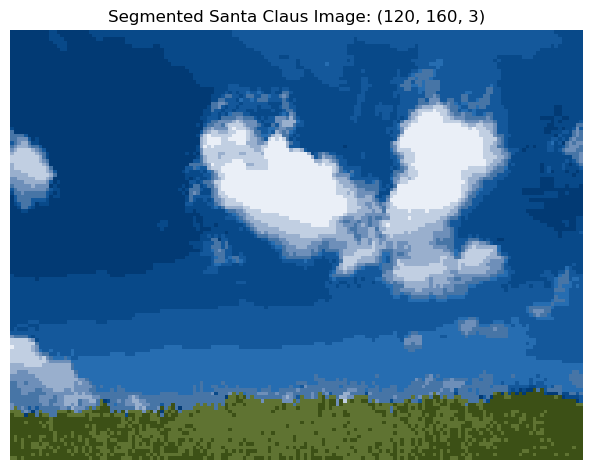

BELOW I'M USING K =  12


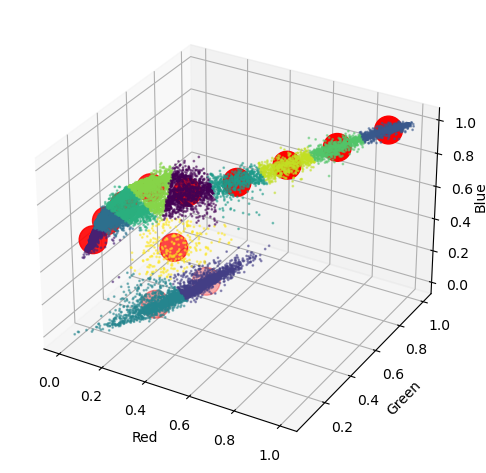

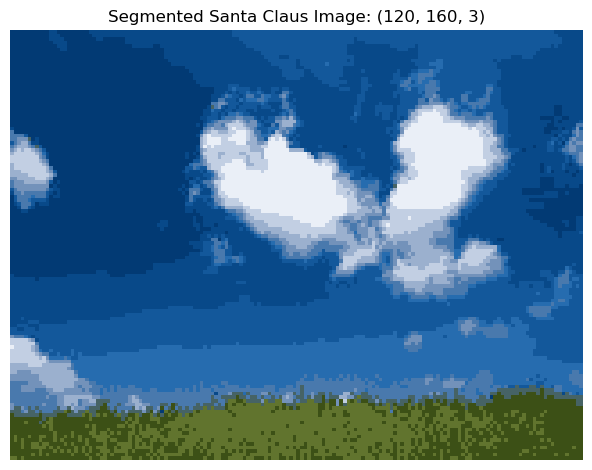

BELOW I'M USING K =  13


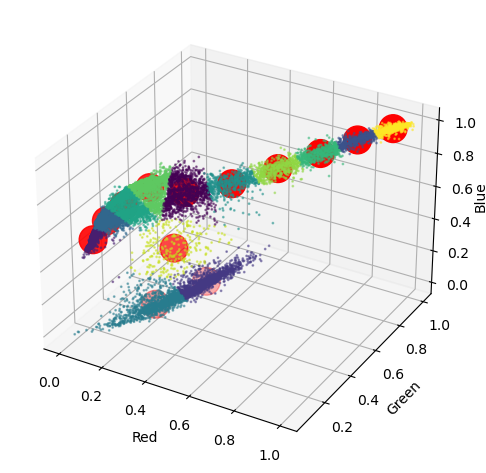

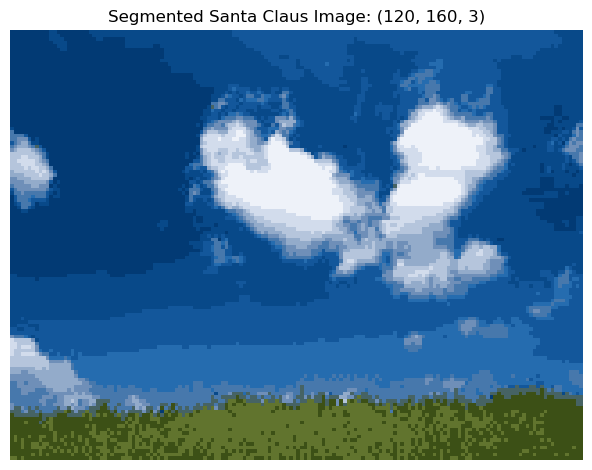

BELOW I'M USING K =  14


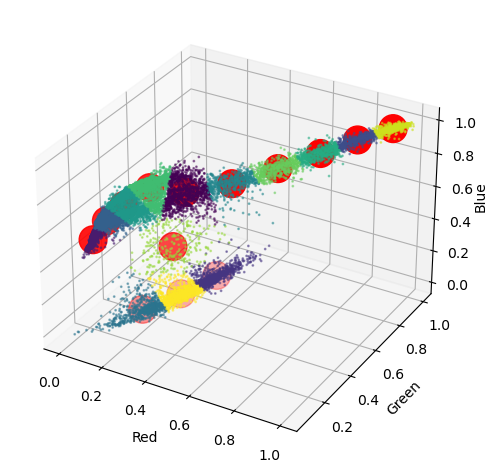

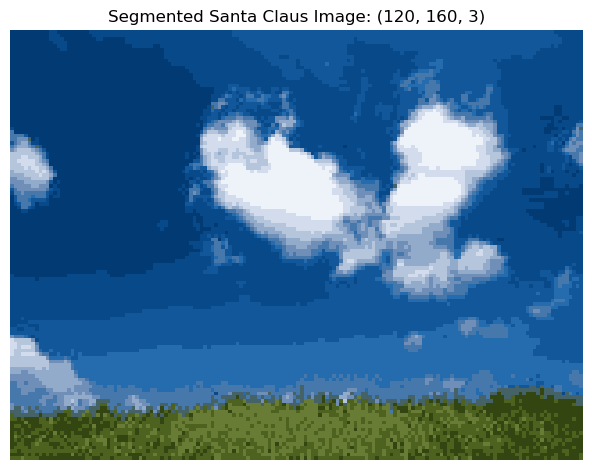

BELOW I'M USING K =  15


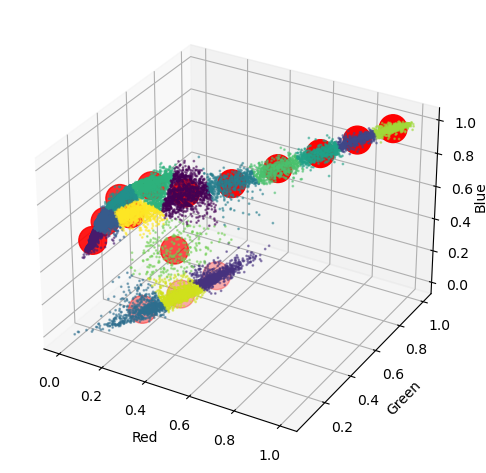

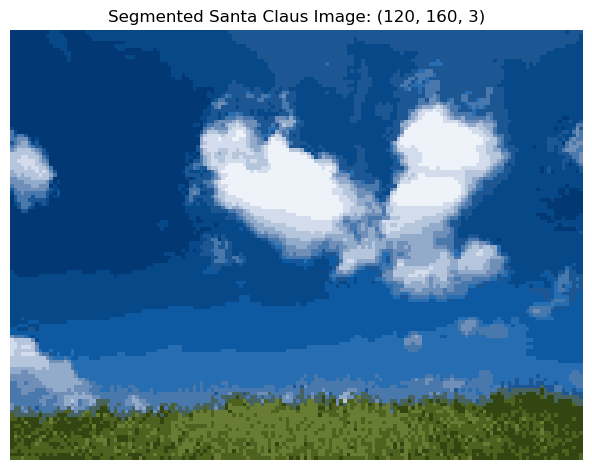

In [18]:
#LANDSCAPE IMAGE
# Reshape the data to a matrix of total_num_pixels x 3
image1 = image1 / 255
num_pixels_landscape = image1.shape[0]*image1.shape[1]
reshaped = image1.reshape(num_pixels_landscape, 3)

print(reshaped)
print(len(reshaped))

# Print the shape of the data and the min and max values of the pixels
max_red = reshaped[:, 0].max()
min_red = reshaped[:, 0].min()

max_green = reshaped[:, 1].max()
min_green = reshaped[:, 1].min()

max_blue = reshaped[:, 2].max()
min_blue = reshaped[:, 2].min()

print(max_red)
print(min_red)
print(max_green)
print(min_green)
print(max_blue)
print(min_blue)

scatter_plot(reshaped, title = "landscape")

# Cycle over different values of K and plot the results for each value
print('\nK-means clustering with different values of K (2-15):')
inertia = list()
for k in range(2,16):
    # Define the K-means model
    print("BELOW I'M USING K = ", k)
    kmeans = KMeans(n_clusters=k, max_iter=50, random_state=0, n_init="auto")

    # Fit the model to the data
    kmeans.fit(reshaped)

    # Get the cluster centers
    kmeans.cluster_centers_

    # Extarct the color values of the centers
    cluster_centers = kmeans.cluster_centers_

    # Reshape the data to the original image shape
    segmented_image = cluster_centers[kmeans.labels_].reshape(image1.shape)

    # Update the inertia
    inertia.append(kmeans.inertia_)
    
    # Plot the scatter plot and the ricolored imag
    scatter_plot(reshaped, kmeans.labels_, kmeans.cluster_centers_)
    img_plot(segmented_image, "Segmented Santa Claus Image")

### TO DO (A.7)

Plot for different values of k (e.g. k between 2 and 15) the respective error of the kmeans algorithm 

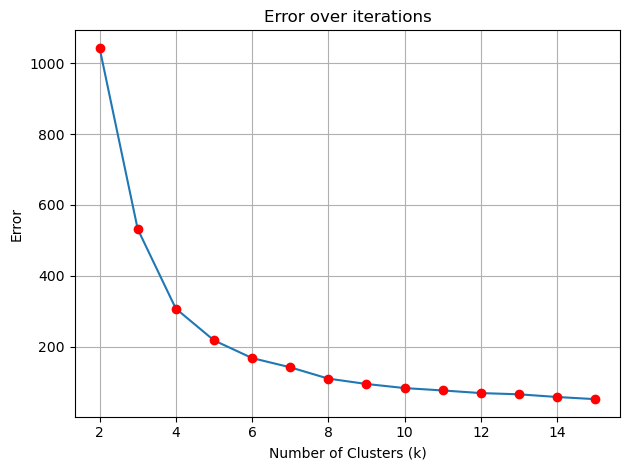

In [19]:
labels=range(2,16)
errors=inertia

plt.plot(labels, errors)
plt.plot(labels, errors, 'ro')
plt.title('Error over iterations')
plt.ylabel('Error')
plt.xlabel('Number of Clusters (k)')
plt.grid()
plt.tight_layout()
plt.show()
plt.close()


[[0.89803922 0.89019608 0.89411765]
 [0.90196078 0.89411765 0.89803922]
 [0.88235294 0.8745098  0.87843137]
 ...
 [0.88235294 0.87843137 0.90196078]
 [0.86666667 0.8627451  0.88627451]
 [0.85882353 0.85490196 0.87843137]]
140500
1.0
0.0196078431372549
1.0
0.0
1.0
0.0


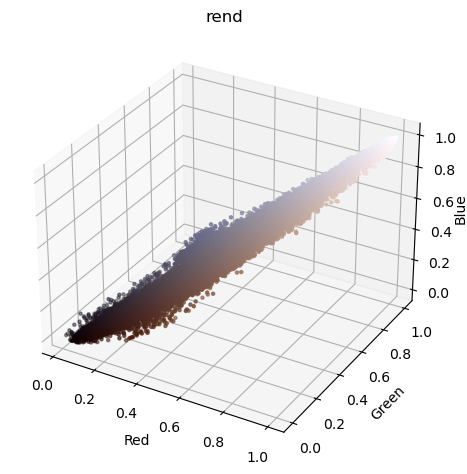


K-means clustering with different values of K (2-15):
BELOW I'M USING K =  2


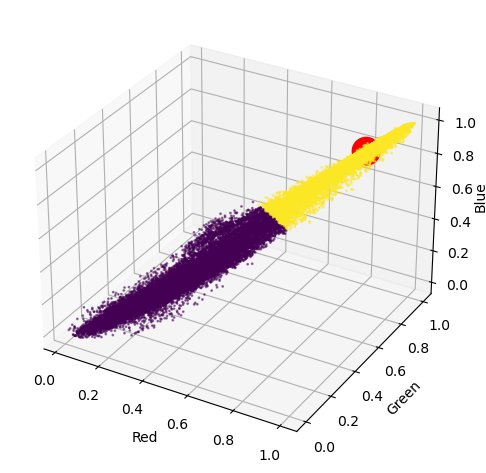

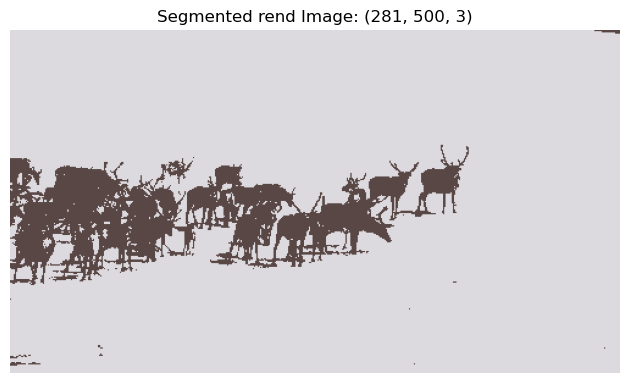

BELOW I'M USING K =  3


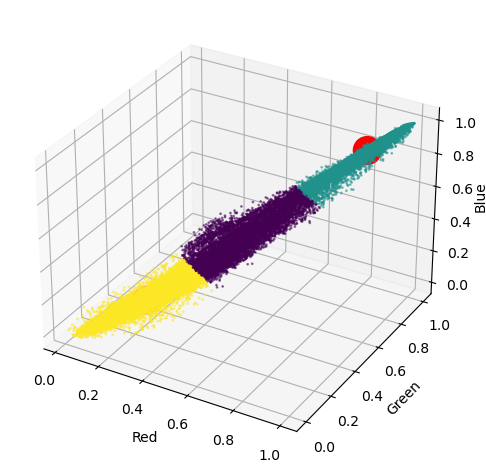

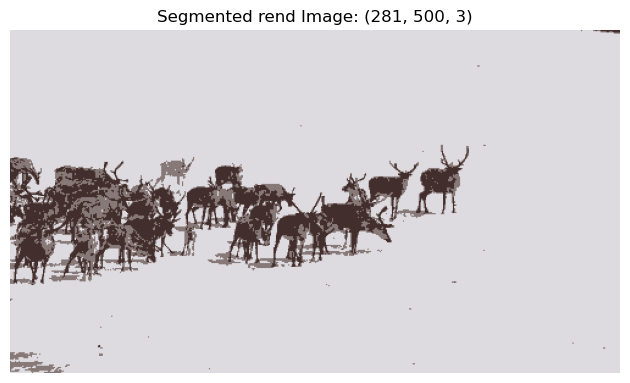

BELOW I'M USING K =  4


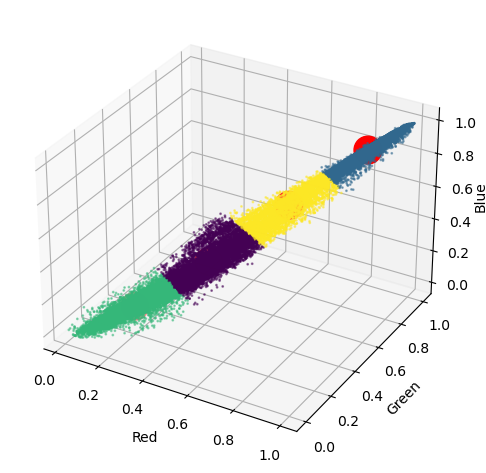

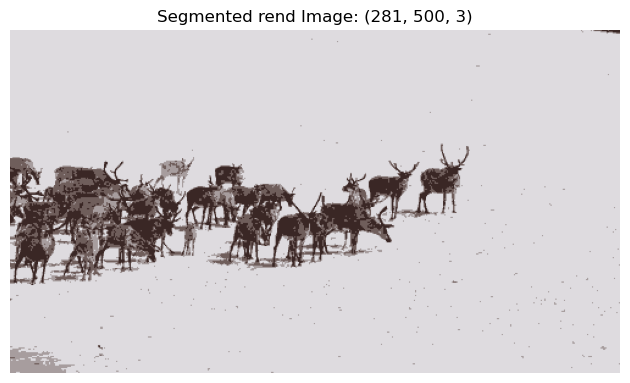

BELOW I'M USING K =  5


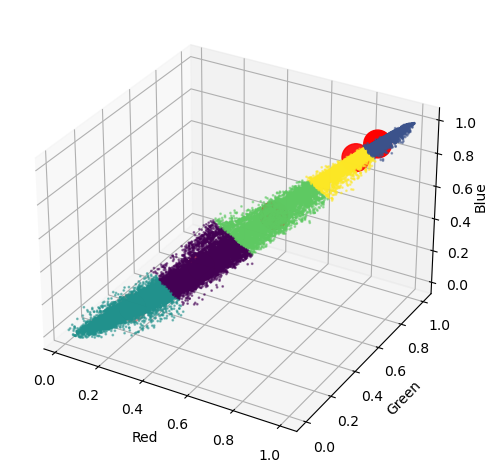

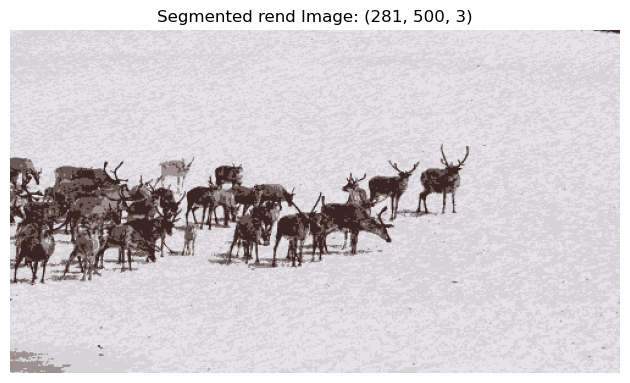

BELOW I'M USING K =  6


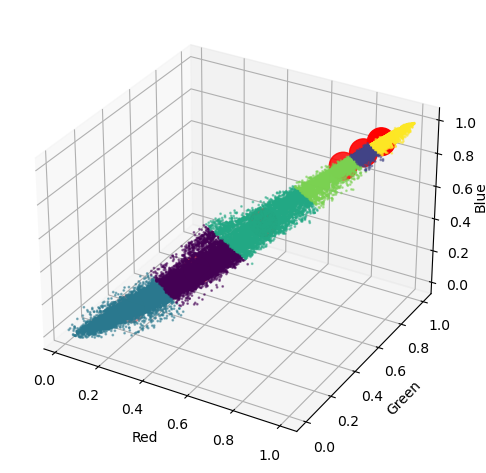

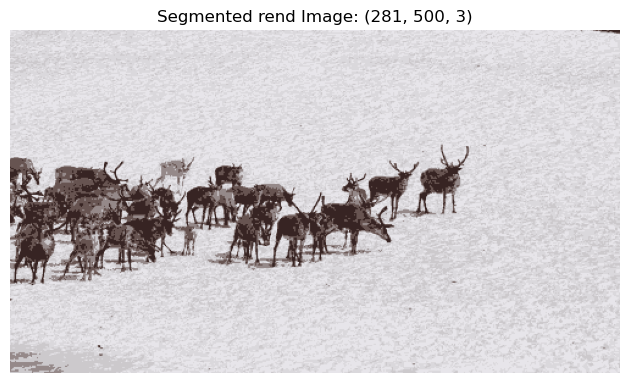

BELOW I'M USING K =  7


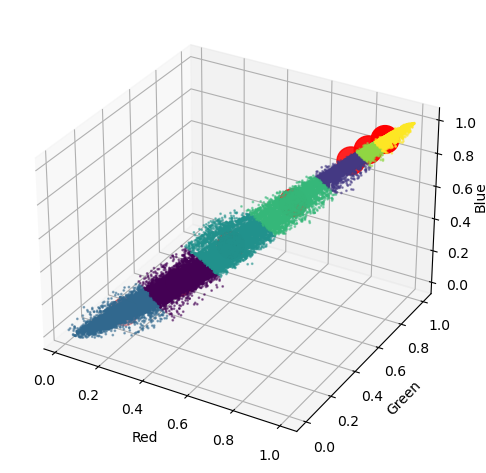

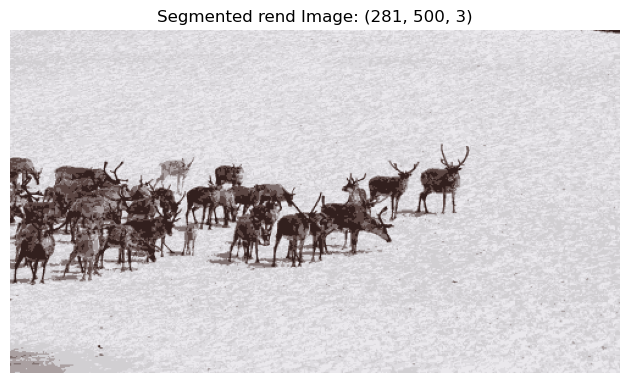

BELOW I'M USING K =  8


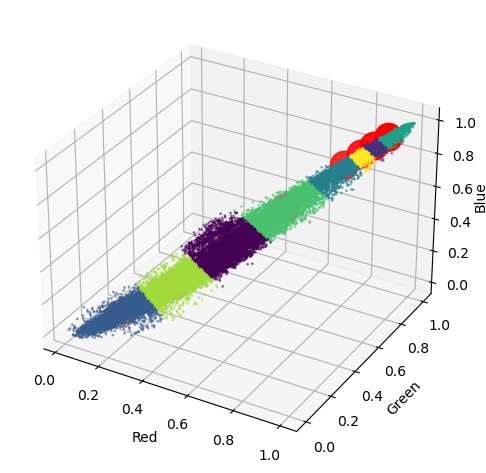

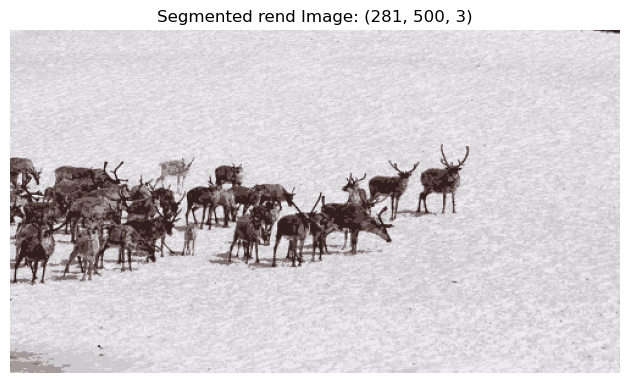

BELOW I'M USING K =  9


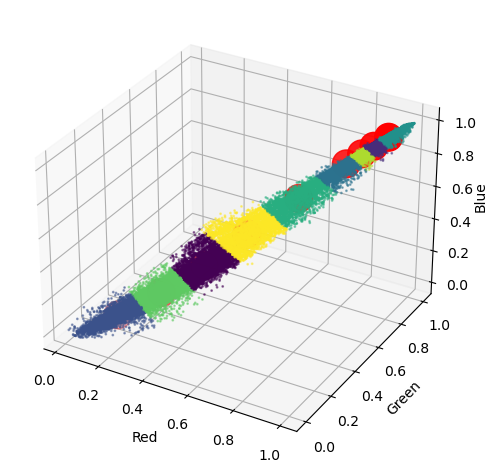

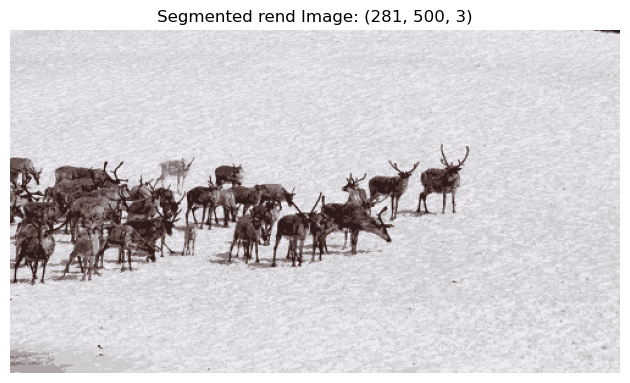

BELOW I'M USING K =  10


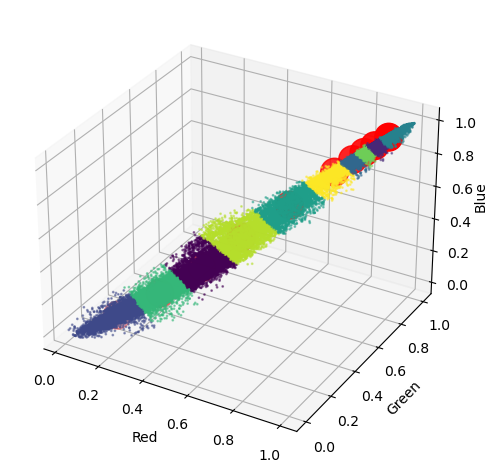

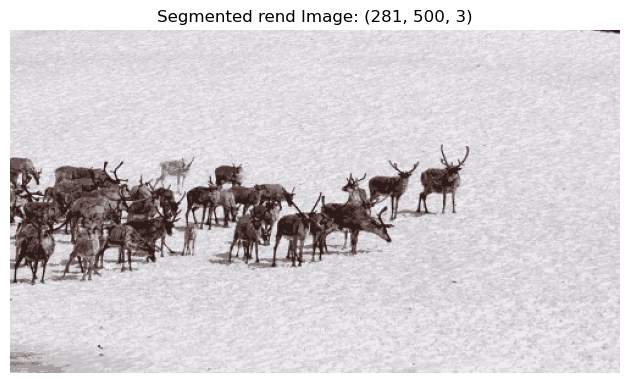

BELOW I'M USING K =  11


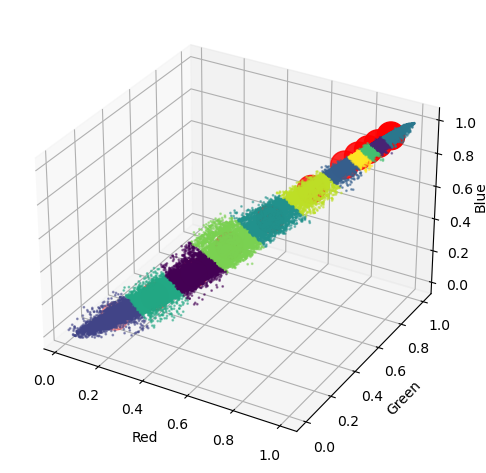

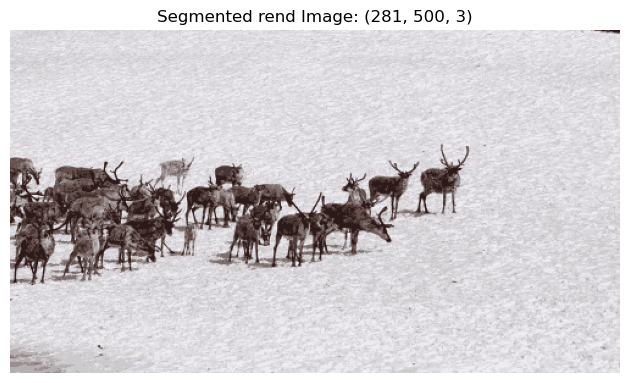

BELOW I'M USING K =  12


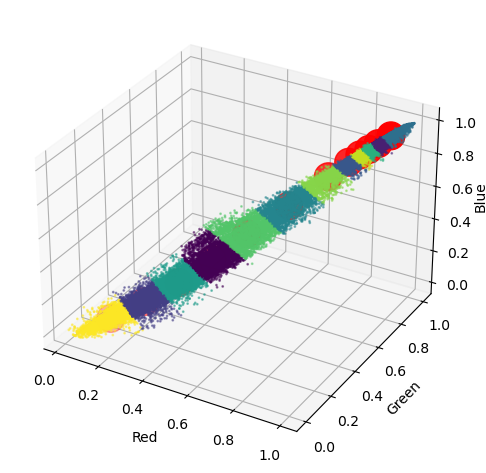

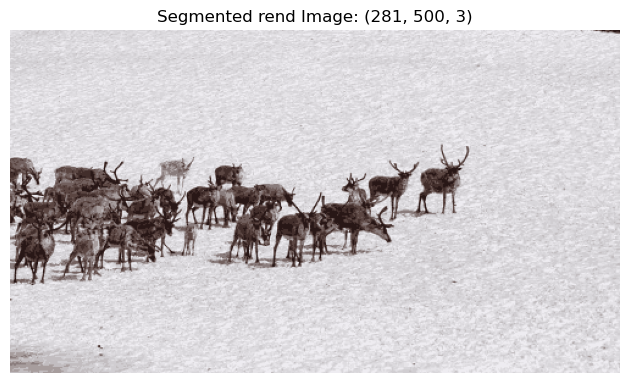

BELOW I'M USING K =  13


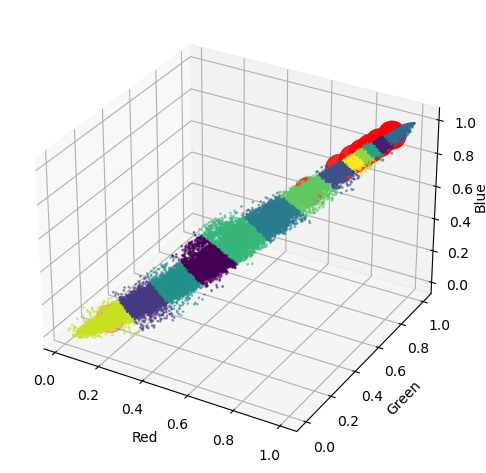

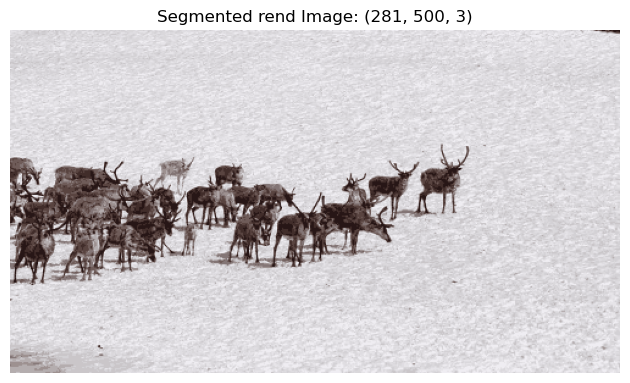

BELOW I'M USING K =  14


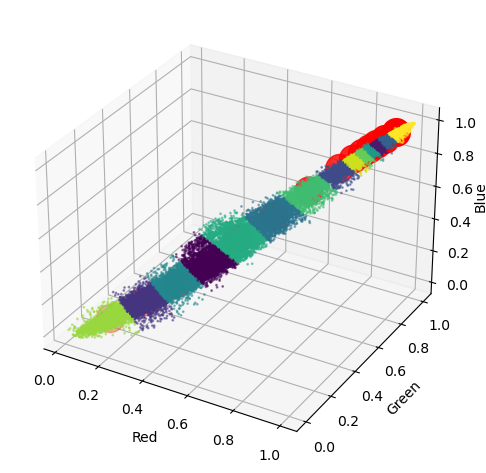

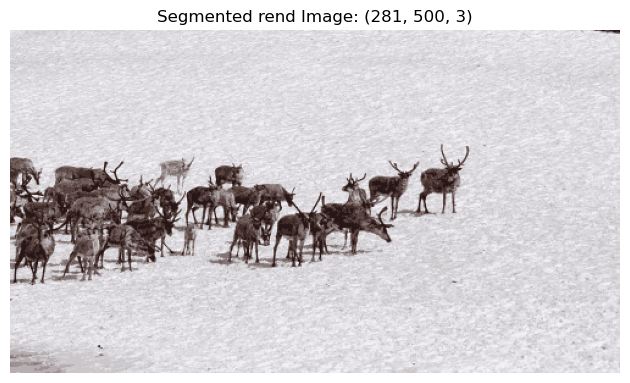

BELOW I'M USING K =  15


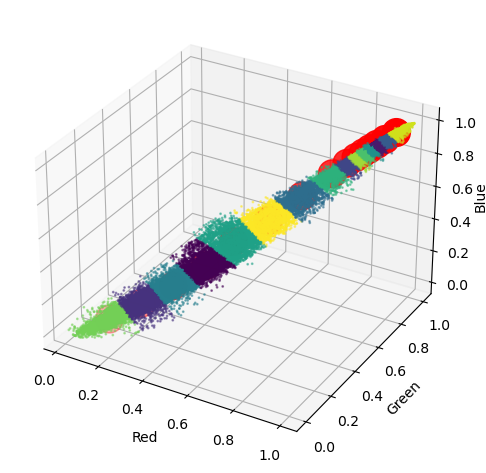

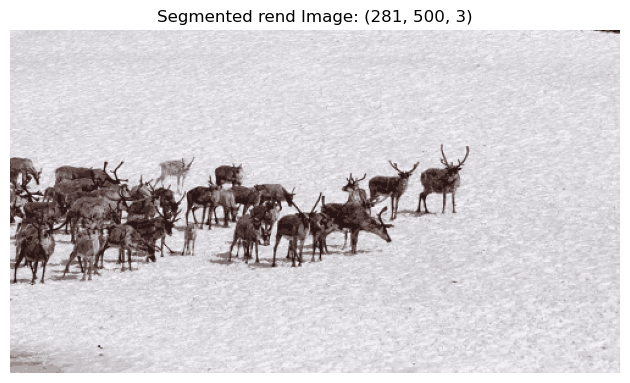

In [20]:
#REND IMAGE
# Reshape the data to a matrix of total_num_pixels x 3
image2 = image2 / 255
num_pixels_rend = image2.shape[0]*image2.shape[1]
reshaped = image2.reshape(num_pixels_rend, 3)

print(reshaped)
print(len(reshaped))

# Print the shape of the data and the min and max values of the pixels
max_red = reshaped[:, 0].max()
min_red = reshaped[:, 0].min()

max_green = reshaped[:, 1].max()
min_green = reshaped[:, 1].min()

max_blue = reshaped[:, 2].max()
min_blue = reshaped[:, 2].min()

print(max_red)
print(min_red)
print(max_green)
print(min_green)
print(max_blue)
print(min_blue)

scatter_plot(reshaped, title = "rend")

# Cycle over different values of K and plot the results for each value
print('\nK-means clustering with different values of K (2-15):')
inertia = list()
for k in range(2,16):
    # Define the K-means model
    print("BELOW I'M USING K = ", k)
    kmeans = KMeans(n_clusters=k, max_iter=50, random_state=0, n_init="auto")

    # Fit the model to the data
    kmeans.fit(reshaped)

    # Get the cluster centers
    kmeans.cluster_centers_

    # Extarct the color values of the centers
    cluster_centers = kmeans.cluster_centers_

    # Reshape the data to the original image shape
    segmented_image = cluster_centers[kmeans.labels_].reshape(image2.shape)

    # Update the inertia
    inertia.append(kmeans.inertia_)
    
    # Plot the scatter plot and the ricolored imag
    scatter_plot(reshaped, kmeans.labels_, kmeans.cluster_centers_)
    img_plot(segmented_image, "Segmented rend Image")

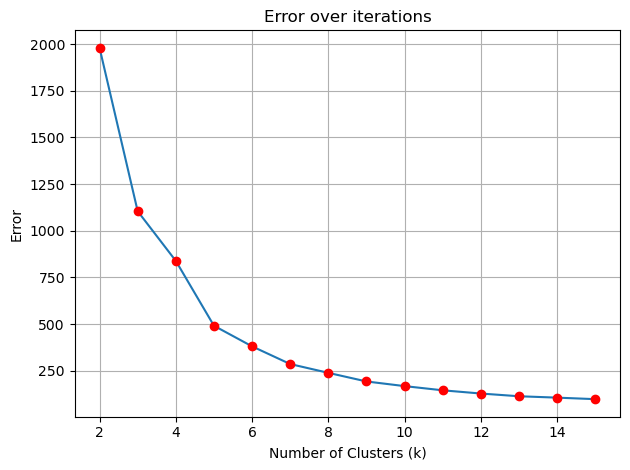

In [21]:
labels=range(2,16)
errors=inertia

plt.plot(labels, errors)
plt.plot(labels, errors, 'ro')
plt.title('Error over iterations')
plt.ylabel('Error')
plt.xlabel('Number of Clusters (k)')
plt.grid()
plt.tight_layout()
plt.show()
plt.close()

### TO DO (AQ.3) [Answare the following]

Compare the results with different values of k, what do you observe? 

Analyze also the error, which one do you think is the optimal value of k?

Is there a single, clear answer?

**ANSWER A.Q3:** 
As was said in the earlier responses, increasing k results in a greater variety of permitted colors. This not only reduces the compression of the image but also reduces the mistake (inertia) that occurs when we match each point to the center of its cluster. As a result, the ideal value of k depends on our goals. For the landscape image, for example, if our only goal is to minimize error, there won't be much of a change after 10–12 clusters. Otherwise, we get a decent understanding of the content maintaining k as low as 3–4 if our goal is only to compress the image. 

---

## B) Linkage-based clustering

The second part of the assignment concern instead linkage-based clustering. We will use the AgglomerativeClustering module of sklearn. 

### TO DO (B.0)

Load the sample dataset located at `data/moon_data.npz`

In [22]:
    # Load sample data
    data = np.load("data/moon_data.npz")

    # Extract data
    x = data['X']
    labels_true = data['labels_true']

    print(x)
    print(labels_true)

[[-0.51671142  0.12336816]
 [-1.05205683  1.21547148]
 [-0.62674339 -0.09401812]
 ...
 [ 1.36142844 -1.12026291]
 [ 0.4792162   0.76152417]
 [-0.37279003 -0.22398523]]
[1 0 1 ... 1 0 1]


### TO DO (B.1)

Now exploit the AgglomerativeClustering algorithm from the sklearn library on the provided sample data points. Use the "single" linkage type that correspond to the minimum distance criteria seen in the lectures and 2 clusters. Notice that the "single" option has been introduced recently in sklearn, if you get an error ensure you have a recent version of the library. Plot the resulting clustering.

In [23]:
# Compute Agglomerative Clustering
# Define the Agglomerative Clustering model
agglomerative = AgglomerativeClustering(n_clusters=2, linkage='single')

# Fit the model to the data
labels_agglomerative = agglomerative.fit_predict(x)

# Compute the number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_agglomerative)) - (1 if -1 in labels_agglomerative else 0)

# Print the results
print(f'Number of clusters: {n_clusters_}')

Number of clusters: 2


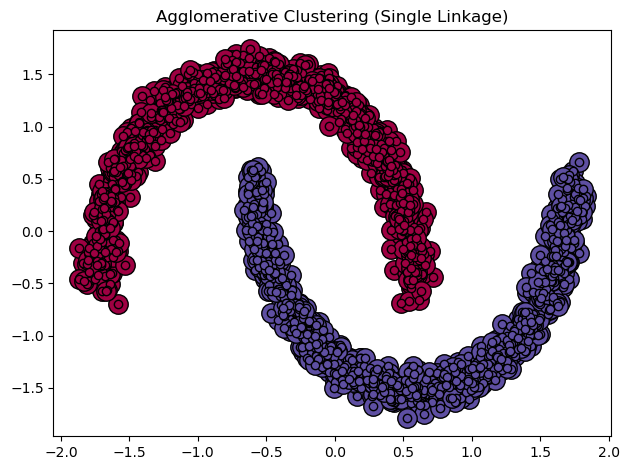

In [24]:
# Plot result 
# Sugestion: use the function cluster_plot()
cluster_plot(labels_agglomerative, x, title='Agglomerative Clustering (Single Linkage)')

### TO DO (B.2)

Now try the KMeans with two clusters on the same dataset we used for the AgglomerativeClustering algorithm.

/home/sdruci/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


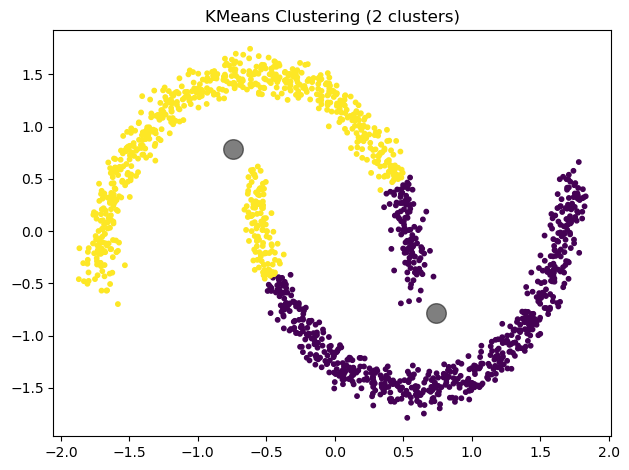

In [25]:
# Define the K-means model
kmeans = KMeans(n_clusters=2, random_state=0)

# Fit the model to the data
kmeans.fit(x)

# Get the cluster centers
cluster_centers_kmeans = kmeans.cluster_centers_

# Extract the color values of the centers
colors_kmeans = kmeans.labels_

# Plot the results
# Sugestion: use the function scatter_plot_2d()
scatter_plot_2d(x, colors_kmeans, cluster_centers_kmeans, title='KMeans Clustering (2 clusters)')


### TO DO (B.Q1) [Answare the following]

Compare the results of K-means and Agglomerative Clustering and explain what you observe and why?

**ANSWER B.Q1:** 
Km forces spherical symmetrys

---